# Converting nii.gz to png
Data was provided with nii.gz extension. This code converts 3D nii.gz files into 2D png images and then creates csv file with path to image and path to corresponding mask

In [ ]:
os.makedirs('2D_Dataset/val/masks')
for filename in os.listdir('2D_Dataset/val/cases'):
  shutil.copy('2D_Dataset/lung_and_infection_masks/'+filename, '2D_Dataset/val/masks')

In [ ]:
import random
import pandas as pd
os.makedirs('2D_Dataset/train/masks/lung', exist_ok=True)
os.makedirs('2D_Dataset/train/masks/both', exist_ok=True)
os.makedirs('2D_Dataset/train/masks/infection', exist_ok=True)

#divide train images into 3 categories by proportion: both_percent, lung_percent, inf_percent
def divide_train_masks(both_percent, lung_percent, inf_percent):
  case_mask = dict()
  case_mask['cases'] = []
  case_mask['masks'] = []
  cases = os.listdir('2D_Dataset/train/images')
  random.shuffle(cases)
  total_cases = len(cases)
  total_both = both_percent*total_cases/100
  total_lung = lung_percent*total_cases/100
  copied_both = 0
  copied_lung = 0
  for filename in tqdm(cases):
    case_mask['cases'].append('2D_Dataset/train/images/'+filename)
    if copied_both < total_both:
      case_mask['masks'].append('2D_Dataset/train/masks/both/'+filename)
      shutil.copy('2D_Dataset/lung_and_infection_masks/'+filename, '2D_Dataset/train/masks/both')
      copied_both += 1
    elif copied_lung < total_lung:
      case_mask['masks'].append('2D_Dataset/train/masks/lung/'+filename)
      shutil.copy('2D_Dataset/lung_masks/'+filename, '2D_Dataset/train/masks/lung')
      copied_lung += 1
    else:
      case_mask['masks'].append('2D_Dataset/train/masks/infection/'+filename)
      shutil.copy('2D_Dataset/infection_masks/'+filename, '2D_Dataset/train/masks/infection')
  case_mask = pd.DataFrame.from_dict(case_mask)
  case_mask.to_csv('2D_Dataset/train/case_mask_train.csv')


In [ ]:
divide_train_masks(25,50,25)

In [ ]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

#vizualize nii.gz file
def show_nib(dir, filename):
  img = nib_to_numpy(dir + '/'+filename)
  for i in range(img.shape[2]):
    curr = np.rot90(img[:,:,i])
    plt.imshow(curr, cmap='gray')
    plt.pause(0.01)
    

def nib_to_numpy(nib_image_name):
  img = nib.load(nib_image_name)
  img = np.array(img.get_data())
  return img

In [ ]:
from pathlib import Path


def convert_to_2D(divider):
  os.makedirs('2D_Dataset/train/images', exist_ok=True)
  os.makedirs('2D_Dataset/train/masks/lung', exist_ok=True)
  os.makedirs('2D_Dataset/train/masks/both', exist_ok=True)
  os.makedirs('2D_Dataset/train/masks/infection', exist_ok=True)
  os.makedirs('2D_Dataset/val/images', exist_ok=True)
  os.makedirs('2D_Dataset/val/masks', exist_ok=True)
  convert_to_2D_train(divider)
  convert_to_2D_val()

In [ ]:
def convert_to_2D_val():
  for filename in sorted(os.listdir('Dataset/val/cases')):
    convert_nib_to_img(filename, 'Dataset/val/cases', '2D_Dataset/val/images')
    convert_nib_to_img(filename,'Dataset/val/masks','2D_Dataset/val/masks')

In [ ]:
def convert_to_2D_train(divider):
  for filename in sorted(os.listdir('Dataset/train/cases')):
    if filename not in divider.case_mask_folder:
      continue
    convert_nib_to_img(filename, 'Dataset/train/cases', '2D_Dataset/train/images')
    mask_folder = divider.case_mask_folder[filename]
    source_folder = os.path.join('Dataset/train/masks', mask_folder)
    dest_folder = os.path.join('2D_Dataset/train/masks', mask_folder)
    convert_nib_to_img(filename,source_folder,dest_folder)

In [ ]:
from PIL import Image
def convert_nib_to_img(filename,folder, new_folder):
  img = nib_to_numpy(folder+'/'+filename)
  for i in range(img.shape[2]):
    currentImg = img[:,:,i]    
    if folder.endswith('cases'):
      if filename.startswith('coronacases'): 
        currentImg = np.clip(currentImg, -1000, 2000)
      currentImg = currentImg - currentImg.min()
      currentImg = currentImg/currentImg.max()*255
    else:
      if folder.endswith('infection'):
        currentImg = currentImg*3
      if filename.startswith('radiopaedia'): 
        currentImg = change_lung_labels(currentImg)

    
    currentImg = Image.fromarray(np.uint8(currentImg),mode='L')
    filename_without_extension = filename.split('.')[0]
    new_path = os.path.join(new_folder,filename_without_extension + '_'+str(i))
    currentImg.save(new_path,'PNG')

def change_lung_labels(img):
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      if img[i][j] == 1:
        img[i][j] = 2
      elif img[i][j] == 2:
        img[i][j] = 1
  return img


In [ ]:
convert_to_2D(divider)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  


In [ ]:
!ls 2D_Dataset/train/images

In [ ]:
import pandas as pd
import os
cases_masks = dict()
cases_masks['cases']=[]
cases_masks['masks']=[]
for filename in os.listdir('2D_Dataset/train/masks/both'):
  cases_masks['masks'].append('2D_Dataset/train/masks/both/'+filename)
  cases_masks['cases'].append('2D_Dataset/train/images/'+filename)


In [ ]:
cases_masks = pd.DataFrame.from_dict(cases_masks)
print(cases_masks)

                                                 cases                                              masks
0           2D_Dataset/train/images/coronacases_010_70     2D_Dataset/train/masks/both/coronacases_010_70
1    2D_Dataset/train/images/radiopaedia_10_85902_3...  2D_Dataset/train/masks/both/radiopaedia_10_859...
2          2D_Dataset/train/images/coronacases_009_215    2D_Dataset/train/masks/both/coronacases_009_215
3          2D_Dataset/train/images/coronacases_005_112    2D_Dataset/train/masks/both/coronacases_005_112
4    2D_Dataset/train/images/radiopaedia_10_85902_3...  2D_Dataset/train/masks/both/radiopaedia_10_859...
..                                                 ...                                                ...
699         2D_Dataset/train/images/coronacases_004_24     2D_Dataset/train/masks/both/coronacases_004_24
700  2D_Dataset/train/images/radiopaedia_40_86625_0_58  2D_Dataset/train/masks/both/radiopaedia_40_866...
701         2D_Dataset/train/images/coronacase

In [ ]:
cases_masks.to_csv('both_data.csv')

In [ ]:
cases_masks['cases']

0             2D_Dataset/train/images/coronacases_010_70
1      2D_Dataset/train/images/radiopaedia_10_85902_3...
2            2D_Dataset/train/images/coronacases_009_215
3            2D_Dataset/train/images/coronacases_005_112
4      2D_Dataset/train/images/radiopaedia_10_85902_3...
                             ...                        
699           2D_Dataset/train/images/coronacases_004_24
700    2D_Dataset/train/images/radiopaedia_40_86625_0_58
701           2D_Dataset/train/images/coronacases_006_52
702          2D_Dataset/train/images/coronacases_001_159
703     2D_Dataset/train/images/radiopaedia_14_85914_0_6
Name: cases, Length: 704, dtype: object

# Training


In [ ]:
import torch
import torchvision
import random
import numpy as np
import torchvision.transforms.functional as TF
import pandas as pd
import os
from PIL import Image
import matplotlib.pyplot as plt


class LungDataset(torch.utils.data.Dataset):
    def __transform_item__(self, image, mask, need_rotation):
      image, mask = (TF.to_tensor(image), TF.to_tensor(mask))
      image, mask = (TF.resize(image, (224, 224)), TF.resize(mask, (224, 224)))
      if need_rotation:
          image = TF.rotate(image, 180)
          mask = TF.rotate(mask, 180)
      elif random.random() > 0.5:
        image += 0.05*torch.randn_like(image)
      angle = (2*random.random()-1)*5
      if random.random() > 0.5:
        image = TF.rotate(image, angle)
        mask = TF.rotate(mask, angle)
      image = image - image.min()
      image = image/image.max()
      mask = mask*255
      mask = mask.round()
      mask = mask.long()
      mask.squeeze_(0)
      return image, mask
    
    def __need_rotation__(self, img_path):
      img_name = img_path.split('/')[-1]
      if img_name.startswith('radiopaedia'):
        return True
      else:
        return False


        

class LungValDataset(LungDataset):
    def __init__(self,root):
        self.masks_path = os.path.join(root, 'masks')
        self.imgs_path = os.path.join(root, 'images')
        self.imgs = list(sorted(os.listdir(self.imgs_path)))
        self.masks = list(sorted(os.listdir(self.masks_path)))

    def __getitem__(self, index):
        img_path = os.path.join(self.imgs_path, self.imgs[index])
        mask_path = os.path.join(self.masks_path, self.masks[index])
        img = Image.open(img_path)
        mask = Image.open(mask_path)
        img, mask = self.__transform_item__(img, mask, self.__need_rotation__(img_path))
        return img, mask
    def __len__(self):
        return len(self.imgs)

class LungTrainDataset(LungDataset):
    def __init__(self,case_mask):
        self.case_mask = pd.read_csv(case_mask)
    
    def __len__(self):
        return len(self.case_mask)
        
    def __choose_mask_folder(self,filename):
      for i in range(len(filename)):
        if filename[-1-i] == '_':
            filename = filename[0:len(filename)-1-i]
            break   
      return self.case_mask_folder[filename+'.nii.gz']

    def __getExistingLabels(self,mask_path):
        mask_folder = mask_path.split('/')[-2]
        if mask_folder == 'lung':
          return torch.tensor([1., 1., 1., 0.])
        elif mask_folder == 'infection':
          return torch.tensor([1., 0., 0., 1.])
        elif mask_folder == 'both':
          return torch.tensor([1., 1., 1., 1.])

    def __getitem__(self, index):
        img_path = self.case_mask['cases'][index]
        mask_path = self.case_mask['masks'][index]
        existingLabels = self.__getExistingLabels(mask_path)
        img = Image.open(img_path)
        mask = Image.open(mask_path)
        img, mask = self.__transform_item__(img, mask, self.__need_rotation__(img_path))
        return img, mask, existingLabels
      

In [ ]:
train_dataset = LungTrainDataset('both_data.csv')
val_dataset = LungValDataset('2D_Dataset/val')

In [ ]:
batch_size = 4
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
len(train_dataloader), len(train_dataset), len(val_dataloader), len(val_dataset)

(176, 704, 176, 704)

In [ ]:
def show_tensor_images(images, title=''):
    for i in range(len(images)):
      images[i] = tensor_image_to_numpy(images[i])
    fig, axes = plt.subplots(nrows=1, ncols=len(images), figsize=(10,5))
    axes[0].imshow(images[0], cmap='gray')
    for i in range(1, len(images)):
      images[i] = images[i]
      axes[i].imshow(images[i])
    plt.title(title)
    plt.show()
    plt.pause(0.001)

In [ ]:
def tensor_image_to_numpy(tensorImage):
    if tensorImage.shape[0] == 1:
        tensorImage.squeeze_(0)
    else:
        tensorImage = tensorImage.permute(1,2,0)
    return tensorImage.numpy()

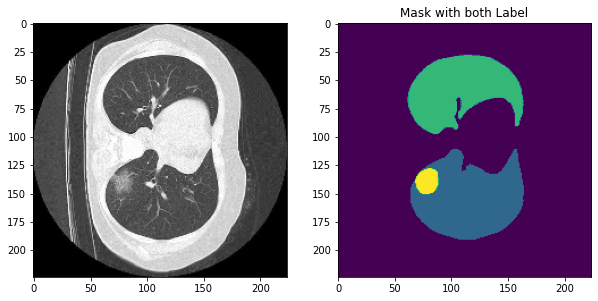

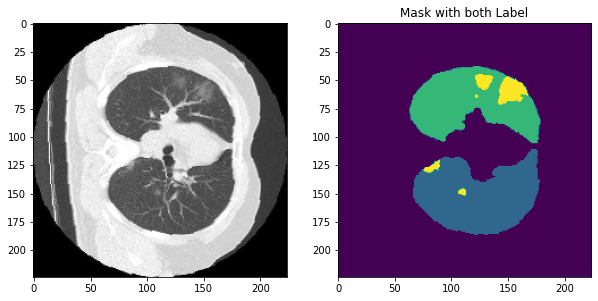

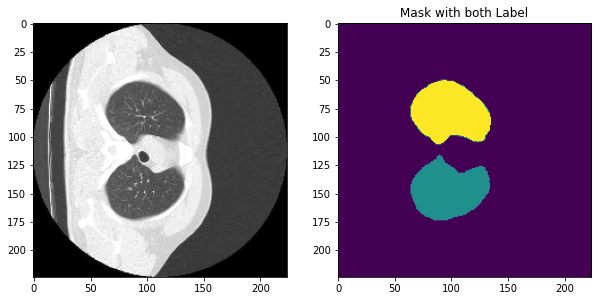

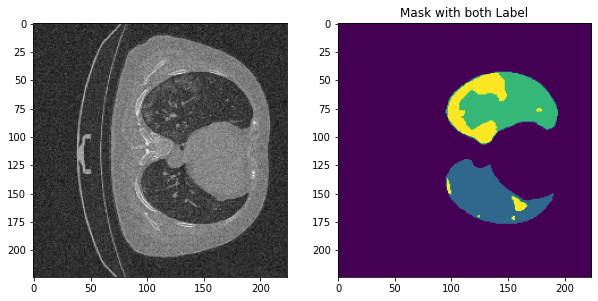

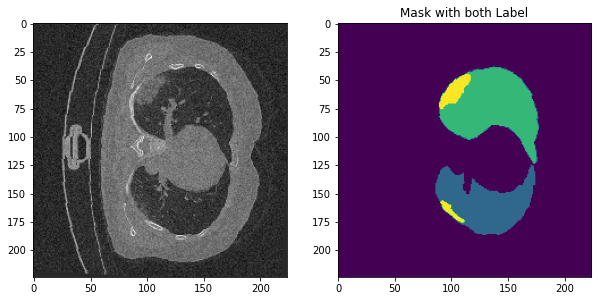

...

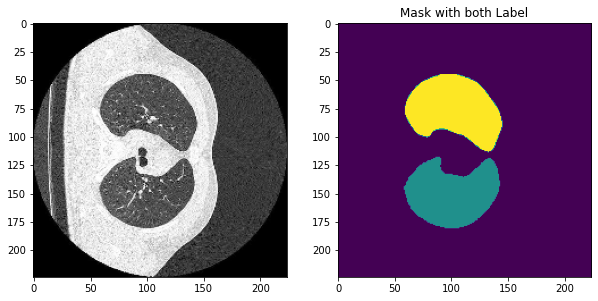

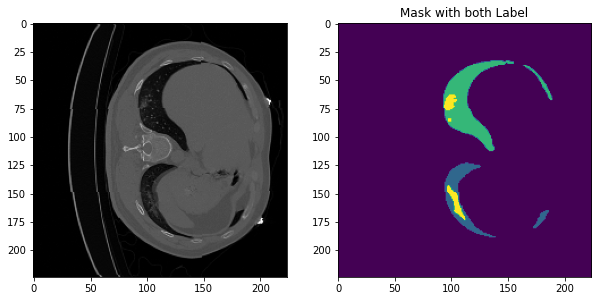

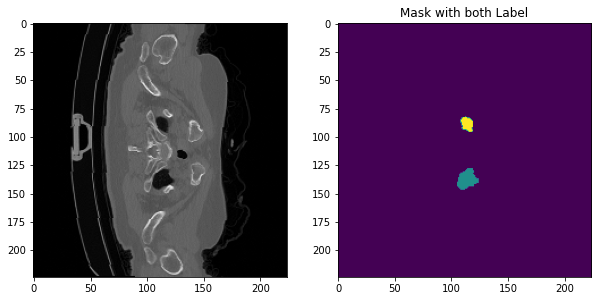

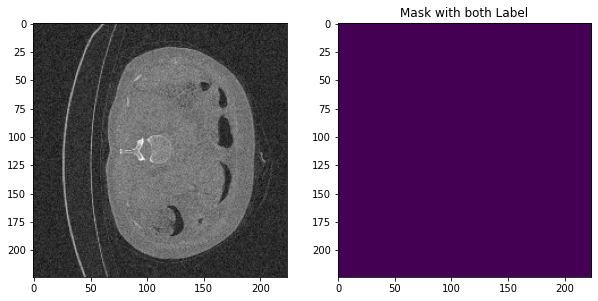

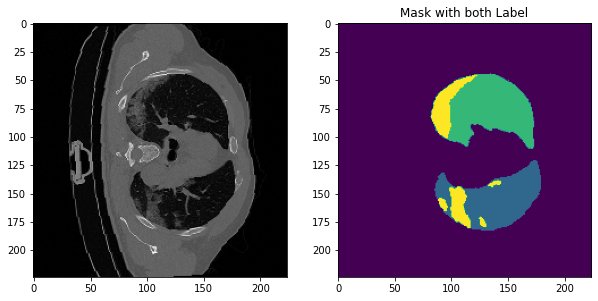

KeyboardInterrupt: ignored

In [ ]:
for X,Y,COVID in train_dataloader:
  for x,y,c in zip(X,Y,COVID):
    mask_title = ''
    if c[3]==1 and c[2]==0:
      mask_title = 'Mask with COVID Label'
    elif c[2]==1 and c[3]==0:
      mask_title = 'Mask with lung Label'
    elif c[2] == 1 and c[3]==1:
      mask_title = 'Mask with both Label' 
    show_tensor_images([x, y.unsqueeze(0)], mask_title)

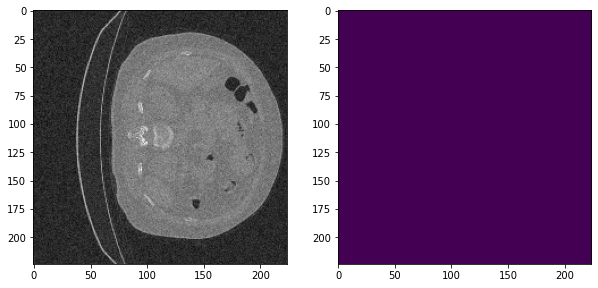

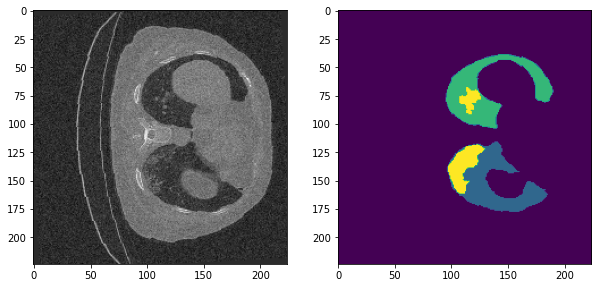

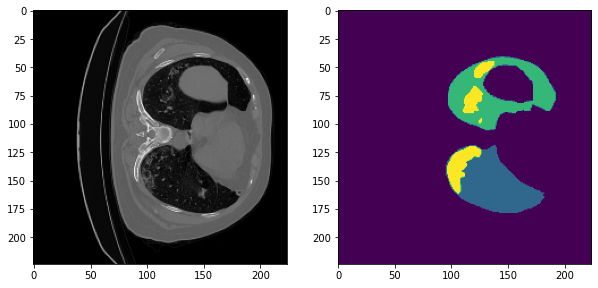

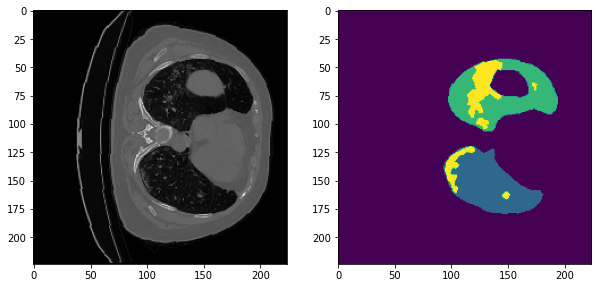

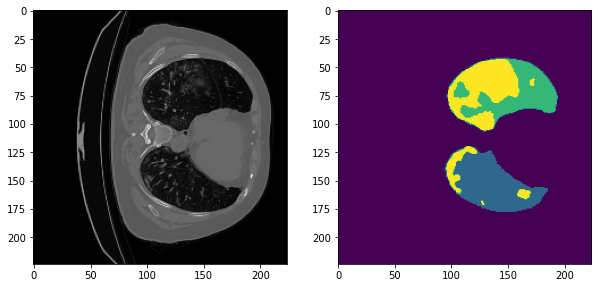

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f8cbe0499e0>


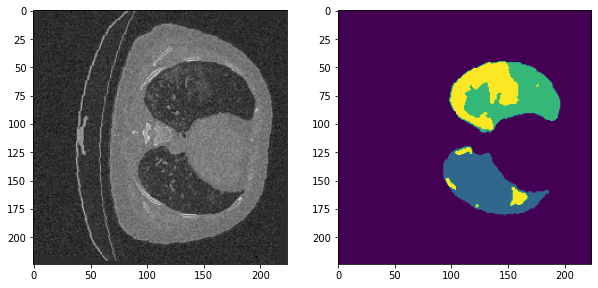

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


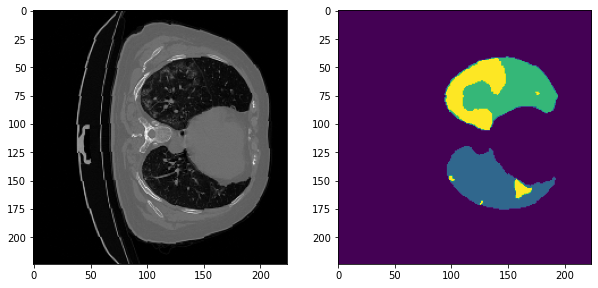

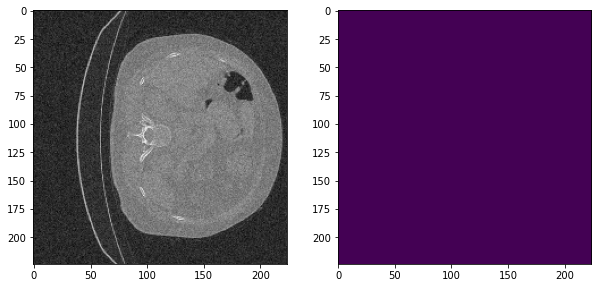

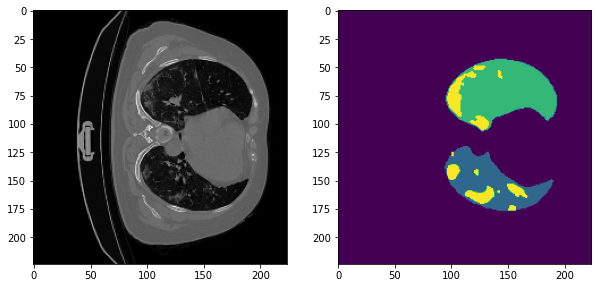

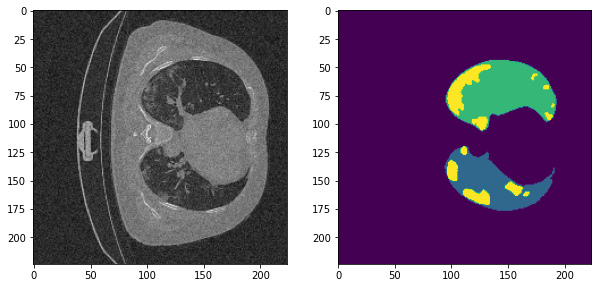

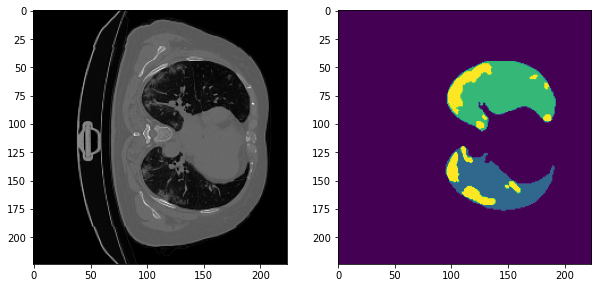

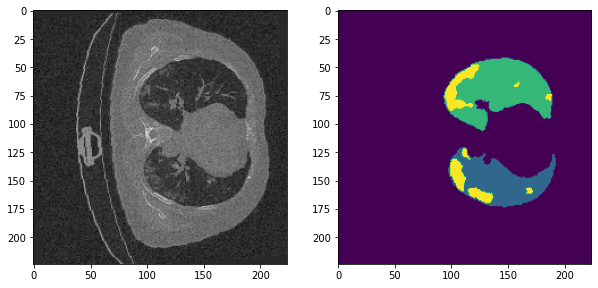

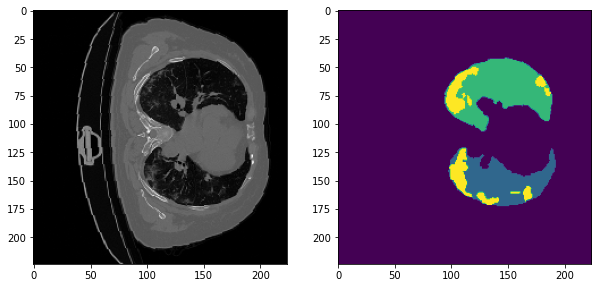

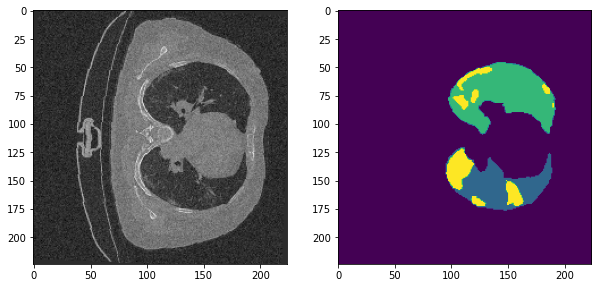

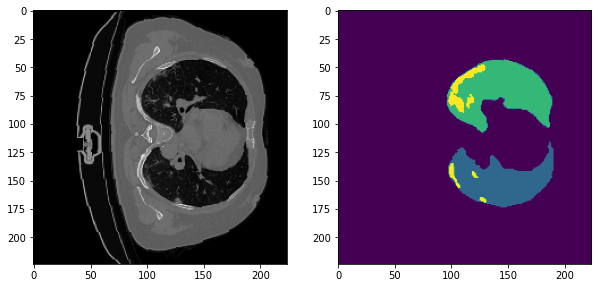

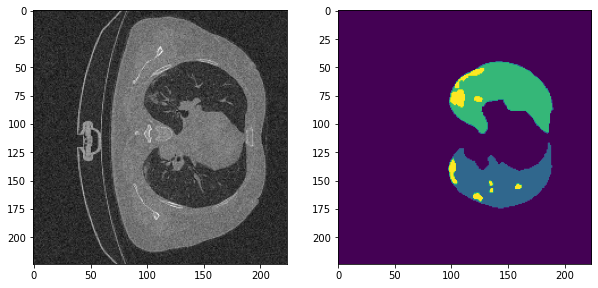

KeyboardInterrupt: ignored

In [ ]:
for X,Y in val_dataloader:
  for x,y in zip(X,Y):
    show_tensor_images([x,y.unsqueeze(0)])

In [ ]:
class U_Net(torch.nn.Module):
    def __init__(self):
        super(U_Net, self).__init__()
        self.MaxPool = torch.nn.MaxPool2d(kernel_size = (2,2), stride = 2)
        self.UpSample = torch.nn.UpsamplingNearest2d(scale_factor = 2)
        self.downLayer1 = torch.nn.Sequential(
            torch.nn.Conv2d(1, 64, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.Conv2d(64, 64, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(64)
        )
        self.downLayer2 = torch.nn.Sequential(
            torch.nn.Conv2d(64, 128, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.Conv2d(128, 128, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(128)
        )
        self.downLayer3 = torch.nn.Sequential(
            torch.nn.Conv2d(128, 256, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.Conv2d(256, 256, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(256)
        )
        
        self.downLayer4 = torch.nn.Sequential(
            torch.nn.Conv2d(256, 512, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.Conv2d(512, 512, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(512)
        )
        
        self.upLayer1 = torch.nn.Sequential(
            torch.nn.Conv2d(512, 1024, kernel_size = (3,3), stride = 1, padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.Conv2d(1024, 1024, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(1024)
        )
        self.upLayer2 = torch.nn.Sequential(
            torch.nn.Conv2d(1536, 512, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.Conv2d(512, 512, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(512)
        )
        self.upLayer3 = torch.nn.Sequential(
            torch.nn.Conv2d(768, 256, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.Conv2d(256, 256, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(256)
        )
        self.upLayer4 = torch.nn.Sequential(
            torch.nn.Conv2d(384, 128, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.Conv2d(128, 128, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(128)
        )
        self.upLayer5 = torch.nn.Sequential(
            torch.nn.Conv2d(192, 64, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.Conv2d(64, 64, kernel_size = (3,3), stride = 1,padding = (1,1)),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(64)
        )
        self.createMask = torch.nn.Conv2d(64,4,kernel_size = (3,3),stride = 1,padding = (1,1))
     
    def forward(self, x):
        down_x1 = x
        for layer in self.downLayer1:
            down_x1 = layer(down_x1);
        
        down_x2 = self.MaxPool(down_x1)
        for layer in self.downLayer2:
            down_x2 = layer(down_x2)
        
        down_x3 = self.MaxPool(down_x2)
        for layer in self.downLayer3:
            down_x3 = layer(down_x3)
        
        down_x4 = self.MaxPool(down_x3)
        for layer in self.downLayer4:
            down_x4 = layer(down_x4)
        
        result = self.MaxPool(down_x4)
        for layer in self.upLayer1:
            result = layer(result)
        
        result = self.UpSample(result)
        result = torch.cat((result, down_x4), dim=1)
        for layer in self.upLayer2:
            result = layer(result)
            
        result = self.UpSample(result)
        result = torch.cat((result, down_x3), dim=1)
        for layer in self.upLayer3:
            result = layer(result)
        
        result = self.UpSample(result)
        result = torch.cat((result, down_x2), dim=1)
        for layer in self.upLayer4:
            result = layer(result)
        
        result = self.UpSample(result)
        result = torch.cat((result, down_x1), dim=1)
        for layer in self.upLayer5:
            result = layer(result)
            
        result = self.createMask(result)
        return result 

In [ ]:
class MyDeepLabV3(torch.nn.Module):
  def __init__(self):
        super(MyDeepLabV3, self).__init__()
        self.conv1 = torch.nn.Conv2d(in_channels=1, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.pretrained_deeplab = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True)
        # for param in self.pretrained_deeplab.parameters():
        #   param.requires_grad = False
        self.pretrained_deeplab.classifier[4] = torch.nn.Conv2d(in_channels=256, out_channels=4, kernel_size=1, stride=1)
  def forward(self, x):
    x = self.conv1(x)
    x = torch.nn.functional.relu(x)
    x = self.pretrained_deeplab(x)
    return x['out']

In [ ]:
random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.determenistic = True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
u_Net_Model = MyDeepLabV3()
# u_Net_Model = U_Net()
u_Net_Model = u_Net_Model.to(device)
# loss = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(u_Net_Model.parameters(), lr=1.0e-4, weight_decay=1.0e-5)

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth


In [ ]:
def evaluate_class_dice(output_model, y_target):
    intersection = torch.sum(output_model*y_target)
    union = torch.linalg.norm(output_model)**2 + torch.linalg.norm(y_target.float())**2
    if (union == 0):
      return 1.0
    return (2*intersection)/union

def create_mask(ground):
    ground = ground.long()
    result = torch.zeros((ground.shape[0], 4, ground.shape[1],ground.shape[2])).long()
    for c in [0,1,2,3]:
      t_i = c*torch.ones_like(ground)
      t_i = (t_i==ground).long()
      result[:,c,:,:] = t_i
    return result

def diceLoss(out, ground, weights = torch.tensor([1.0, 1.0, 1.0, 1.0])):
  out = torch.nn.functional.softmax(out, dim=1)
  target = create_mask(ground).to(out.device)
  dice = torch.tensor([0.0], device=out.device)
  for class_index in range(out.shape[1]):
    dice += weights[class_index]*evaluate_class_dice(out[:,class_index], target[:,class_index])
  dice = dice/torch.sum(weights)
  return 1-dice



In [ ]:
def loss(out, ground, weights):
  return 0.5*diceLoss(out, ground, weights) + 0.5*torch.nn.functional.cross_entropy(out, ground, weights)

In [ ]:
history_loss = []
def train_model(model, num_epochs, loss, optimizer, device,train_dataloader,val_dataloader):
    min_loss = 1e10
    for epoch in range(num_epochs):
        print('Epoch {}/{}:'.format(epoch, num_epochs - 1), flush=True)
        for phase in ['train', 'val']:
            if phase == 'train':
                dataloader = train_dataloader
                model.train()  # Set model to training mode
            else:
                dataloader = val_dataloader
                model.eval()   # Set model to evaluate mode

            running_loss = 0.

            # Iterate over data.
            running_dice = np.zeros(4)
            for item in (dataloader):
                inputs = item[0]
                masks = item[1]
                existingLabels = torch.ones(batch_size,dtype=torch.float64)
                if phase == 'train':
                  existingLabels = item[2]
                inputs = inputs.to(device)
                masks = masks.to(device)
                optimizer.zero_grad()
                # forward and backward
                with torch.set_grad_enabled(phase == 'train'):
                    preds = model(inputs)
                    loss_value = torch.tensor([0.0]).to(device)
                    for i in range(len(preds)):
                      if (phase == 'train'):
                        weights = getLossWeights(existingLabels[i]).to(device)
                      loss_value += loss(preds[i].unsqueeze(0), masks[i].unsqueeze(0),weights) 
                    #backward + optimize only if in training phase
                    if phase == 'train':
                        loss_value.backward()
                        optimizer.step()

                # statistics
                running_loss += loss_value.item()/len(inputs)

            epoch_loss = running_loss / len(dataloader)
            if phase == 'val':
              if epoch_loss < min_loss:
                min_loss = epoch_loss
                torch.save(u_Net_Model.state_dict(), 'semi_params.txt')
              history_loss.append(epoch_loss)
            print(phase + ' loss = ', epoch_loss)
              


In [ ]:
def isEqualTensors(lhs, rhs):
  for i in range(lhs.shape[0]):
    if lhs[i] != rhs[i]:
      return False
  return True
def getLossWeights(existingLabels):
  if isEqualTensors(existingLabels, torch.tensor([1., 1., 1., 0.])):
    return torch.tensor([1., 0, 0, 0.])
  elif isEqualTensors(existingLabels, torch.tensor([1., 0., 0., 1.])):
    return torch.tensor([0., 0., 0., 1.])
  else:
    return torch.tensor([1, 1., 1., 1.])

In [ ]:
train_model(u_Net_Model,200,loss,optimizer,device,train_dataloader,val_dataloader)

Epoch 0/199:
train loss =  0.4680918964811347
val loss =  0.2933428547429768
Epoch 1/199:
train loss =  0.24540209181776101
val loss =  0.19982067385519092
Epoch 2/199:
train loss =  0.19377913935617966
val loss =  0.17880545332181183
Epoch 3/199:
train loss =  0.17580093604258515
val loss =  0.17017081919634205
Epoch 4/199:
train loss =  0.1696286203593693
val loss =  0.1626013295767321
Epoch 5/199:
train loss =  0.16219336247410288
val loss =  0.15707212849520147
Epoch 6/199:
train loss =  0.15752910888245839
val loss =  0.15350636079992083
Epoch 7/199:
train loss =  0.1543022857936607
val loss =  0.1557210993487388
Epoch 8/199:
train loss =  0.15197769514369694
val loss =  0.15327778026800265
Epoch 9/199:
train loss =  0.15026426082476974
val loss =  0.1502983245194297
Epoch 10/199:
train loss =  0.14877678083509885
val loss =  0.1488206518538804
Epoch 11/199:
train loss =  0.14587784914130514
val loss =  0.14725310836960984
Epoch 12/199:
train loss =  0.14690471104007552
val loss =

KeyboardInterrupt: ignored

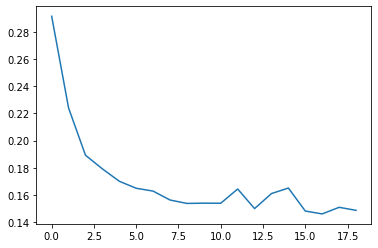

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history_loss)

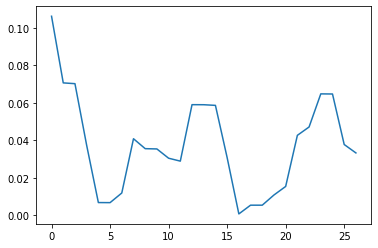

In [ ]:
avg_history_loss = []
for i in range(len(history_loss)-4):
  avg_history_loss.append(sum(history_loss[i:i+4])/4)
plt.plot(avg_history_loss)

# Vizualization


In [ ]:
# Import PyDrive and associated libraries.
# This only needs to be done once per notebook.
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

file_id = '1simunBV1N3VvSONYsNbbp8vZeHXzz6cq'
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('params')

In [ ]:
u_Net_Model_prev = U_Net();
u_Net_Model_prev = u_Net_Model_prev.to(device)
u_Net_Model_prev.load_state_dict(torch.load('params'))

In [ ]:
def show_pred(filename):
  test1 = Image.open(filename)
  test1 = TF.to_tensor(test1)
  test1 = TF.resize(test1, (224, 224))
  test1 = TF.rgb_to_grayscale(test1)
  test1 = TF.rotate(test1, -90)
  test1 = torch.clip(test1, 0.3, 0.6)
  test1 = test1 - test1.min()
  test1 = test1/test1.max()
  # test1 += 0.05*torch.randn_like(test1)
  u_Net_Model.eval()
  pred = u_Net_Model(test1.unsqueeze(0).to(device))
  pred = make_prediction(pred)
  show_tensor_images([test1, pred])

In [ ]:
def make_prediction(model_output):
    model_output = model_output.detach()
    model_output = torch.nn.functional.softmax(model_output, dim=1)
    # model_output = model_output.round()
    pred = model_output.argmax(dim=1)
    # pred = model_output[:,3] 
    return pred.cpu()

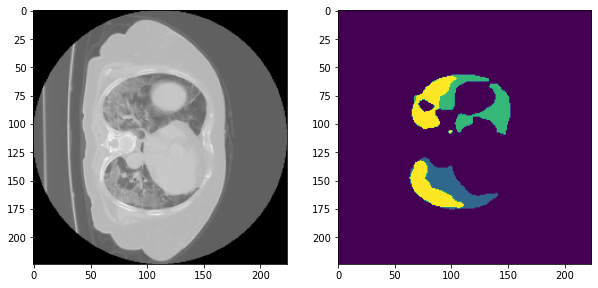

In [ ]:
show_pred('test_3.png')

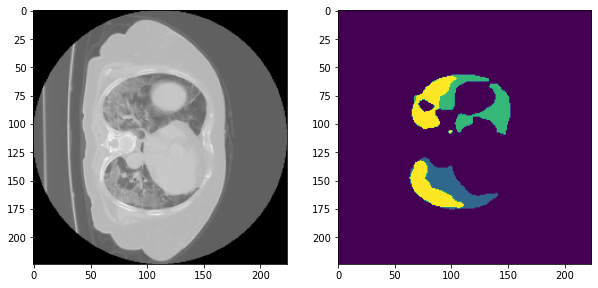

In [ ]:
show_pred('test_3.png')

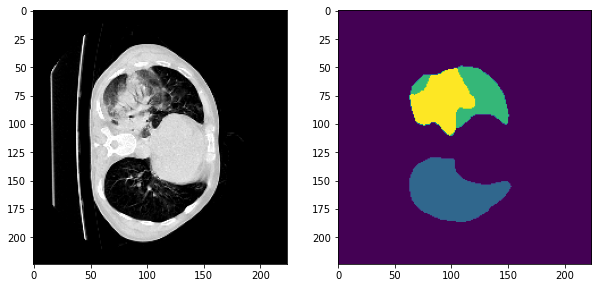

In [ ]:
show_pred('test_1.png')

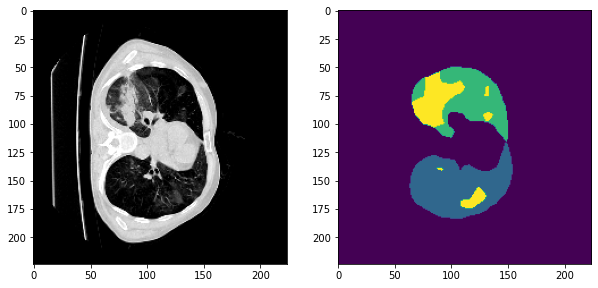

In [ ]:
show_pred('test_2.png')

In [ ]:
def vizualize_predictions(model, dataloader):
  for X, Y in dataloader:
    model.eval()
    for i in range(batch_size):
        x = X[i]
        print('n = ', i)
        out = model(x.unsqueeze(0).to(device))
        pred = make_prediction(out)
        show_tensor_images([x, pred, Y[i].unsqueeze(0)])

n =  0


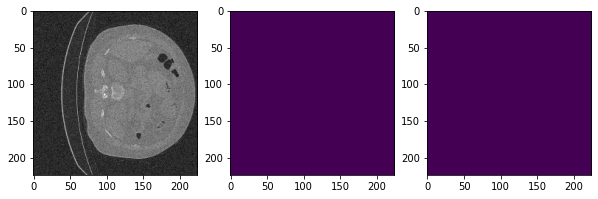

n =  1


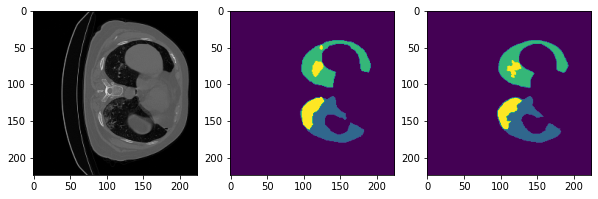

n =  2


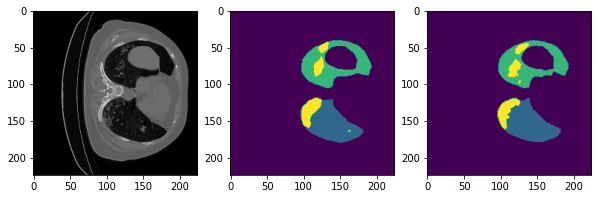

n =  3


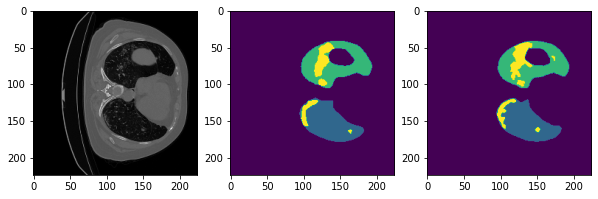

n =  0


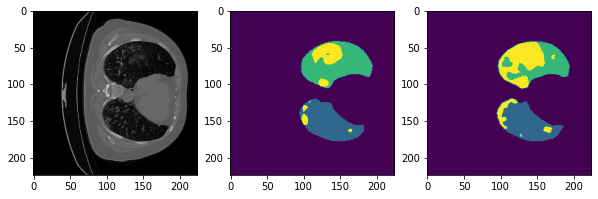

n =  1


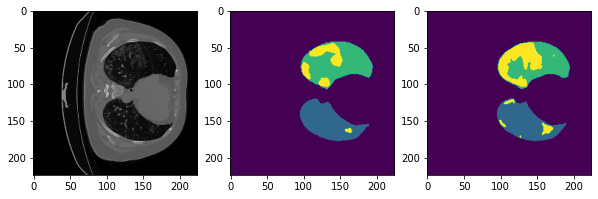

n =  2


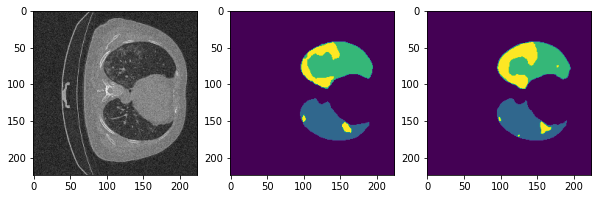

n =  3


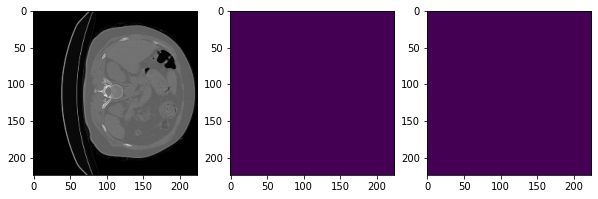

n =  0


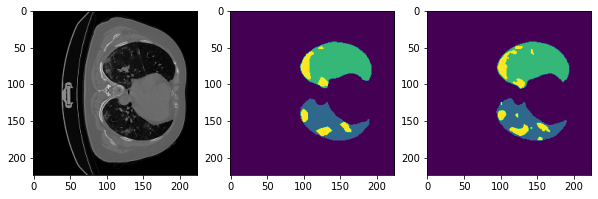

n =  1


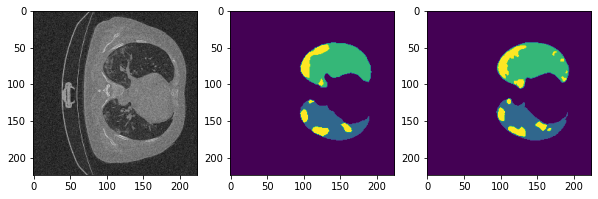

n =  2


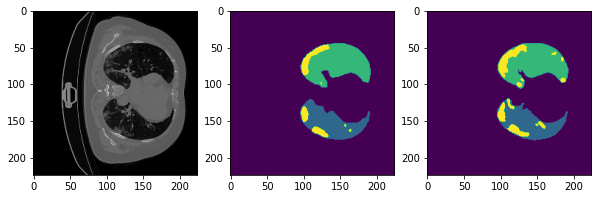

n =  3


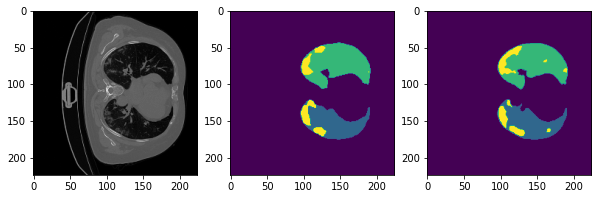

n =  0


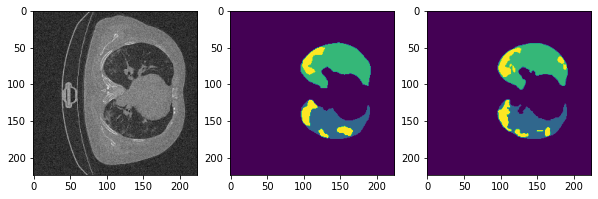

n =  1


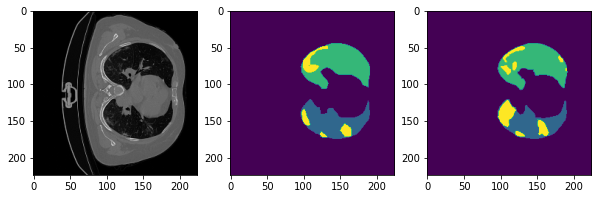

n =  2


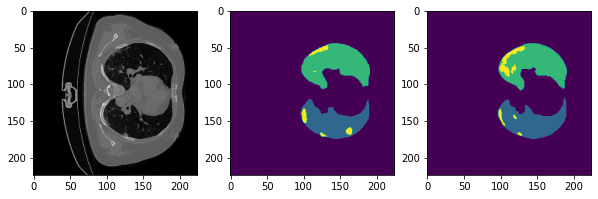

n =  3


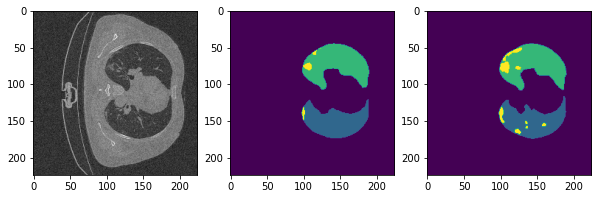

n =  0


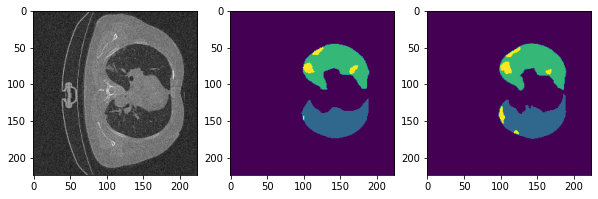

n =  1


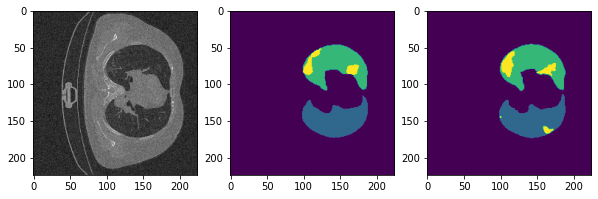

n =  2


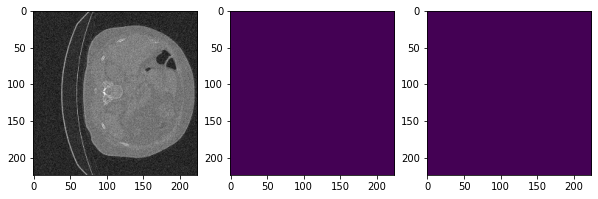

n =  3


KeyboardInterrupt: ignored

In [ ]:
vizualize_predictions(u_Net_Model, val_dataloader)

n =  0


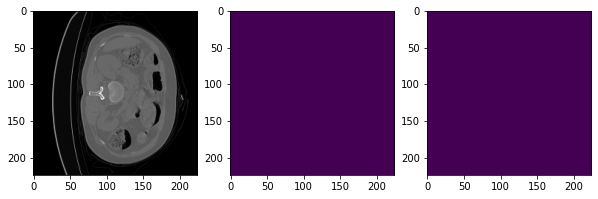

n =  1


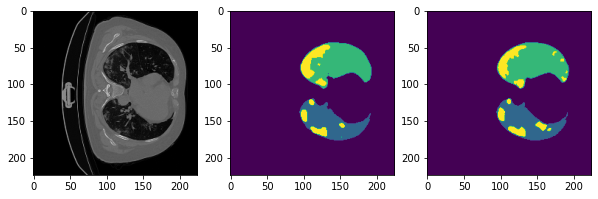

n =  2


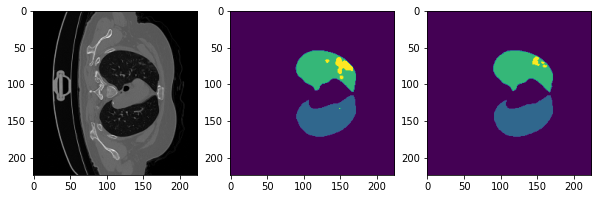

n =  3


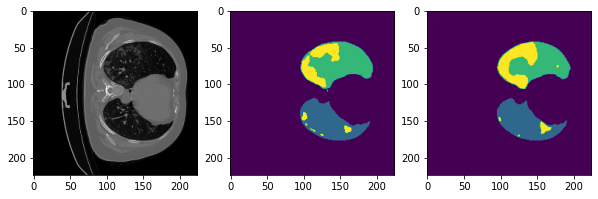

n =  4


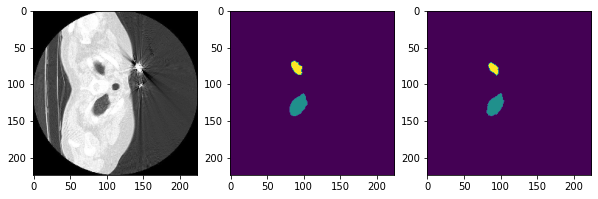

n =  5


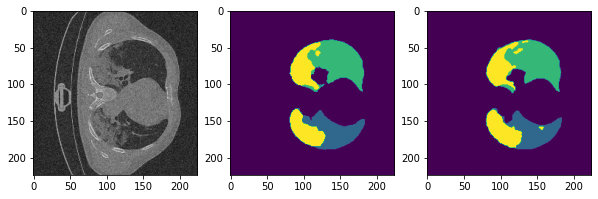

n =  6


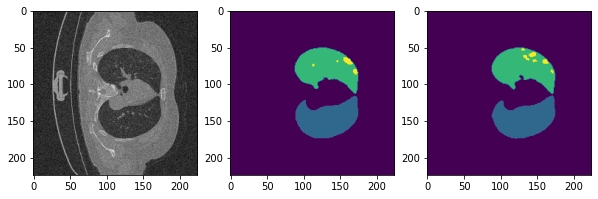

n =  7


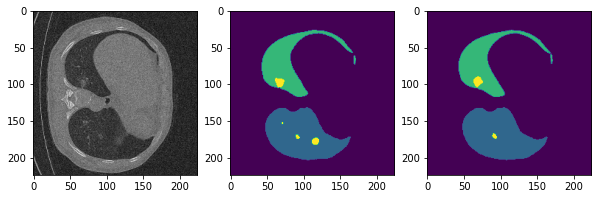

n =  0


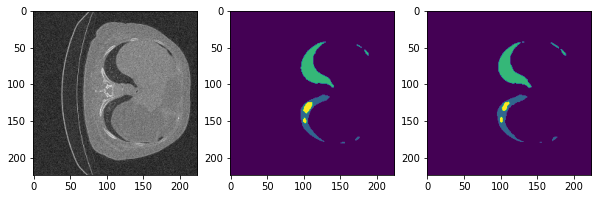

n =  1


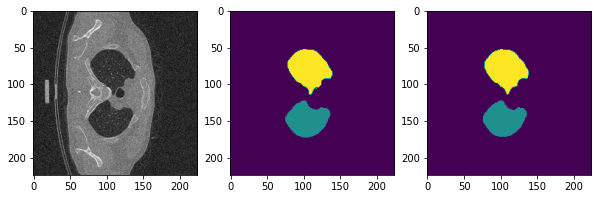

n =  2


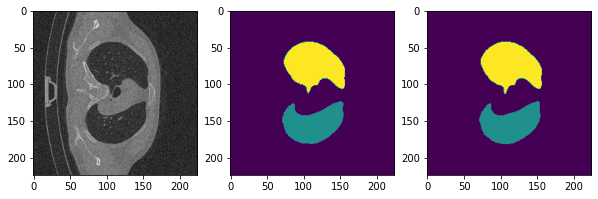

n =  3


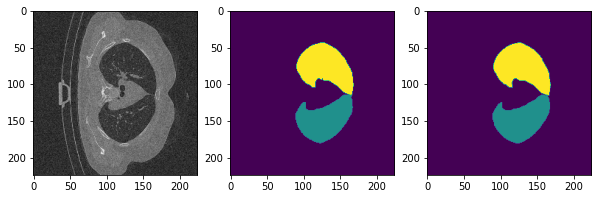

n =  4


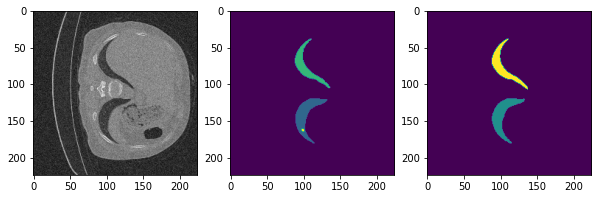

n =  5


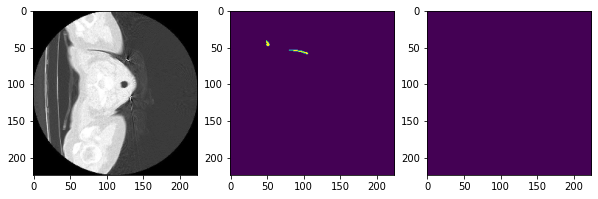

n =  6


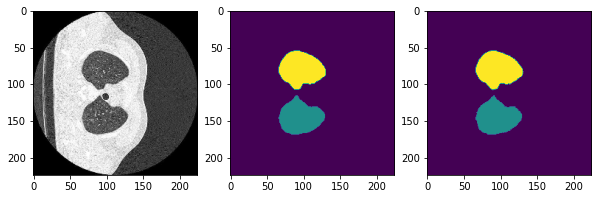

n =  7


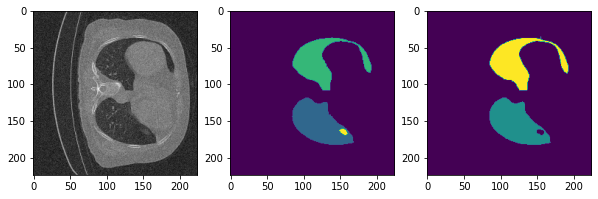

n =  0


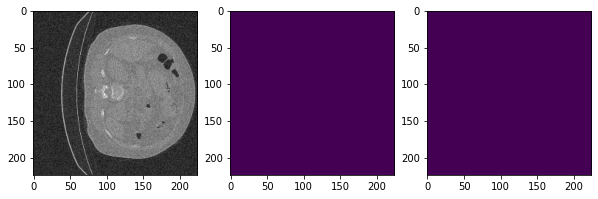

n =  1


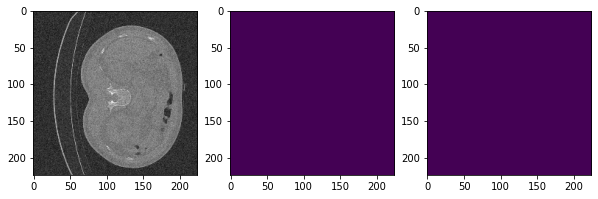

n =  2


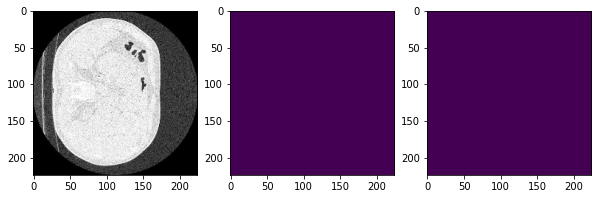

n =  3


KeyboardInterrupt: ignored

<Figure size 720x360 with 0 Axes>

In [ ]:
val_dataloader_withshuffle = torch.utils.data.DataLoader(val_dataset, batch_size,shuffle=True, num_workers=batch_size)
vizualize_predictions(u_Net_Model, val_dataloader_withshuffle)

# Metrics

In [ ]:
!cat COVID19_cases/ReadMe.txt

The 20 CT scans are from the Coronacases Initiative and Radiopaedia that can be freely downloaded from https://academictorrents.com/details/136ffddd0959108becb2b3a86630bec049fcb0ff with license CC BY-NC-SA.

Our contributions are labeling left lung (1), right lung (2) and infections (3) in each CT scan.
The license of annotations is also CC BY-NC-SA.



In [ ]:
def evaluate_dice_batch(out, ground):
  out = torch.nn.functional.softmax(out, dim=1)
  out = out.round()
  batch_dice = np.zeros(out.shape[1])
  target = create_mask(ground).to(out.device)
  for class_index in range(out.shape[1]):
      batch_dice[class_index] += evaluate_class_dice(out[:,class_index], target[:,class_index])
  return batch_dice

In [ ]:
def evaluate_dice_dataset(dataloader):
  dice_coef = np.zeros(4)
  u_Net_Model.eval()
  num_batch = 0
  for X,Y in dataloader:
    print('num_batch = '+ str(num_batch)+'/'+str(len(dataloader)))
    Out = u_Net_Model(X.to(device))
    batch_dice = evaluate_dice_batch(Out, Y)
    dice_coef += batch_dice
    print(batch_dice)
    num_batch += 1    
  dice_coef = dice_coef/len(dataloader)
  return dice_coef

In [ ]:
val_dataloader1 = torch.utils.data.DataLoader(val_dataset,batch_size=1, shuffle=False, num_workers=1)
dice_coef = evaluate_dice_dataset(val_dataloader1)

num_batch = 0/704
[1. 1. 1. 1.]
num_batch = 1/704
[0.99560767 0.89405936 0.93677479 0.87134176]
num_batch = 2/704
[0.99721068 0.94759154 0.92830485 0.8595745 ]
num_batch = 3/704
[0.99644774 0.92827308 0.92227978 0.78385419]
num_batch = 4/704
[0.99752897 0.92779243 0.78765279 0.72361344]
num_batch = 5/704
[0.99789423 0.93845606 0.87769228 0.78117782]
num_batch = 6/704
[0.99753845 0.95019847 0.89463001 0.82431573]
num_batch = 7/704
[1. 1. 1. 1.]
num_batch = 8/704
[0.99696016 0.90838218 0.93591225 0.77044612]
num_batch = 9/704
[0.99576318 0.91758001 0.90867227 0.76582825]
num_batch = 10/704
[0.99618971 0.88132638 0.92322272 0.72014755]
num_batch = 11/704
[0.9965229  0.90836298 0.94551575 0.80374759]
num_batch = 12/704
[0.99617779 0.88534892 0.92090398 0.70238096]
num_batch = 13/704
[0.9965682  0.83639657 0.93339413 0.56451619]
num_batch = 14/704
[0.99646473 0.94622868 0.9403125  0.67535073]
num_batch = 15/704
[0.99602664 0.93319196 0.95088047 0.61310256]
num_batch = 16/704
[0.99583787 0.9

In [ ]:
print('background =', dice_coef[0])
print('left lung =', dice_coef[1])
print('right lung =', dice_coef[2])
print('infection =',  dice_coef[3])

background = 0.9974840376526117
left lung = 0.9207302437981443
right lung = 0.9251289963722229
infection = 0.8474220799398609


In [ ]:
u_Net_Model.load_state_dict(torch.load('semi_params.txt'))

<All keys matched successfully>

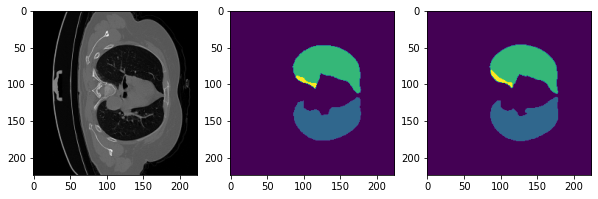

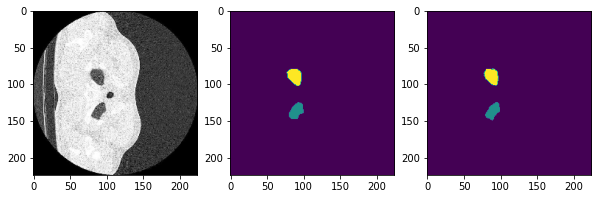

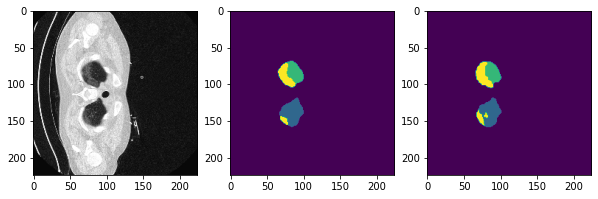

In [ ]:
  n = 0
  indexes = [587,416,684]
  for X, Y in val_dataloader1:
    u_Net_Model.eval()
    if n in indexes:
      for i in range(1):
          x = X[i]
          out = u_Net_Model(x.unsqueeze(0).to(device))
          pred = make_prediction(out)
          show_tensor_images([x, pred, Y[i].unsqueeze(0)])
          plt.pause(0.0001)
    n+=1

# Save parameters


In [ ]:
torch.save(u_Net_Model.state_dict(), 'semi_params.txt')

# Results



In [ ]:
#28 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#with rotation
#lr=1e-4
#pretrained deeplabv3_resnet101

background = 0.9974827113645998
left lung = 0.9166017352836207
right lung = 0.9281921455297958
infection = 0.8410126798024232

In [ ]:
#train on coronaceses+radiopaedia+marked mosmed+unmarked mosmed
#eval on coronaceses+radiopaedia
#14 epochs + 7 epochs + 2 epochs + 8 epochs + 4 epochs
background = 0.9976244416426528
left lung = 0.9207229964773763
right lung = 0.9287366527979347
infection = 0.8420943314876322

In [ ]:
#train on coronaceses+radiopaedia+marked mosmed+unmarked mosmed
#eval on coronaceses+radiopaedia
#14 epochs + 7 epochs + 2 epochs
background = 0.9976034865460612
left lung = 0.9175734553295611
right lung = 0.9247981478375468
infection = 0.8421935928794979

In [ ]:
#19 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#with rotation
#lr=1e-4
#pretrained deeplabv3_resnet101
#train on both data only
background = 0.997164320116016
left lung = 0.8580234283978246
right lung = 0.9117766906406772
infection = 0.8018189787240275

In [ ]:
#24 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#with rotation
#lr=1e-4
#pretrained deeplabv3_resnet101
#parameters with min los
background = 0.997362284836444
left lung = 0.9177288437865421
right lung = 0.9140709279613062
infection = 0.8013121721609919

In [ ]:
#24 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#lr=1e-4
#pretrained deeplabv3_resnet101
#parameters with min los
background = 0.997698382220485
left lung = 0.9212018335132267
right lung = 0.9313875307455998
infection = 0.8145037435381461

In [ ]:
#24 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#lr=1e-4
#pretrained deeplabv3_resnet101
background = 0.9976996563544328
left lung = 0.9212079479634254
right lung = 0.9324832236690616
infection = 0.8145739266871136

In [ ]:
#10 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#lr=1e-4
#pretrained deeplabv3_resnet101

background = 0.9966847519813613
left lung = 0.903491454124874
right lung = 0.9172307725741782
infection = 0.7682639408607925

In [ ]:
#30 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#lr=1e-4
#deeplabv3_resnet101
#parameters with min loss

background = 0.9966020814397119
left lung = 0.8922258976540021
right lung = 0.9033513741080903
infection = 0.7228177769125481

In [ ]:
#30 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#lr=1e-4
#deeplabv3_resnet101

background = 0.9968639675697143
left lung = 0.8942416706201832
right lung = 0.9067228558388624
infection = 0.7210506941456433

In [ ]:
#22 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#lr=1e-4
#U_Net
#parameters with min loss
background = 0.9981036027046767
left lung = 0.9274480868003924
right lung = 0.9285461651161313
infection = 0.7680919220967387

In [ ]:
#22 epochs
#proportion 4 8 4
#dice loss + CE
#with noise in coronacases
#lr=1e-4
#U_Net
background = 0.9983719173310832
left lung = 0.9317920897738077
right lung = 0.9375558585267175
infection = 0.7872748300062746

In [ ]:
#range (0.0, 0.5)
#30 epochs
#proportion 4 8 4
#dice loss + CE
#with noise
#lr=1e-4
#deeplabv3_resnet50
#parameters with min loss
background = 0.9948587174246297
left lung = 0.8790802138223803
right lung = 0.8240995891193843
infection = 0.4704924926161766

In [ ]:
#range (0.0, 0.5)
#22 epochs
#proportion 4 8 4
#dice loss + CE
#with noise
#lr=1e-4
#u_net
#parameters with min loss
background = 0.9980429896236171
left lung = 0.8996625191537586
right lung = 0.9076426657170233
infection = 0.7261079353693675

In [ ]:
#range (0.0, 0.5)
#22 epochs
#proportion 4 8 4
#dice loss + CE
#with noise
#lr=1e-4
#u_net
background = 0.9980803050938443
left lung = 0.9107237563683437
right lung = 0.897457766638705
infection = 0.7355628920763114

In [ ]:
#range (0.0, 0.5)
#20 epochs
#proportion 4 8 4
#dice loss + CE
#with noise
#lr=1e-4
#deeplabv3_resnet50
background = 0.9942365481303288
left lung = 0.821901835697378
right lung = 0.8203875150377229
infection = 0.44905736279734493

In [ ]:
#lungs combined
#range (0.05, 0.95)
#39 epochs
#proportion 4 8 4
#dice loss + CE
#with noise
#lr=1e-4
background = 0.9976125204980504
left lung = 0.8676390673158205
right lung = 0.6662910825163288

In [ ]:
#few data
#epochs 24
#DL + CE
background =  0.997084733411556
left lung =  0.8641244730895561
right lung =  0.8707946523089133
infection =  0.6525406410050301

In [ ]:
#range (0.05, 0.95)
#38 epochs
#proportion 4 8 4
#infection weight [0., 0., 0., 1.]
#lung weight [1., 0., 0., 0.]
#both weight [1., 2., 2., 1.]
#dice loss + CE
#with noise
#lr=1e-4
background = 0.9980560443410931
left lung = 0.825074585199626
right lung = 0.8881259121270607
infection = 0.7457052367735632

In [ ]:
#range (0.05, 0.95)
#36 epochs
#proportion 4 8 4
#infection weight [0., 0., 0., 1.]
#lung weight [1, 0.5, 0.5, 0.]
#dice loss + CE
#with noise
#lr=1e-4
background = 0.9982941894224232
left lung = 0.8982538153572941
right lung = 0.9137282578510718
infection = 0.6407566039548471

In [ ]:
#range (0.05, 0.95)
#28 epochs
#proportion 4 8 4
#infection weight [0.1, 0., 0., 1.]
#lung weight [1, 0.5, 0.5, 0.]
#dice loss + CE
#with noise
#lr=1e-4
background = 0.9825603978134977
left lung = 0.7530517726834447
right lung = 0.7471723244619186
infection = 0.6510558215089862

In [ ]:
#range (-1000, 0)
#30 epochs
#proportion 4 8 4
#infection weight [0., 0., 0., 1.]
#lung weight [1, 0.5, 0.5, 0.]
#dice loss + CE
background = 0.9860636043356483
left lung = 0.731521876624326
right lung = 0.7041916608851696
infection = 0.5129865440002234

In [ ]:
#range (-1000, 0)
#30 epochs
#proportion 4 8 4
#infection weight [0.5, 0., 0., 1.]
#lung weight [1, 0.5, 0.5, 0.]
#dice loss + CE

background = 0.9575243398026899
left lung = 0.4455524073338287
right lung = 0.263532550473276
infection = 0.7493265561480992

In [ ]:
#range (-1000, 0)
#11 epochs
#proportion 4 8 4
#infection weight [0.5, 0., 0., 1.]
#lung weight [1, 0.5, 0.5, 0.]
#dice loss + CE
background = 0.9877271500927615
left lung = 0.6784540528031087
right lung = 0.6942400933687598
infection = 0.49026000043489365

In [ ]:
#range (-1000, 0)
#11 epochs
#proportion 4 8 4
#infection weight [0.5, 0., 0., 1.]
#lung weight [1, 0.5, 0.5, 0.]
#dice loss + CE
background = 0.9945658819536328
left lung = 0.7749435051880267
right lung = 0.8752276863250694
infection = 0.5343299586666932

In [ ]:
#range (-1000, 0)
#11 epochs
#proportion 4 8 4
#infection weight [0.5, 0., 0., 1.]
#lung weight [1, 0.5, 0.5, 0.]
#dice loss
background = 0.9956405257555081
left lung = 0.7504260418660211
right lung = 0.8033207284672639
infection = 0.46277665995975853

In [ ]:
#range (-1000, 0)
#52 epochs
#proportion 4 8 4
#infection weight [0.5, 0., 0., 1.]
#lung weight [1, 0.5, 0.5, 0.]

background = 0.9675910256112304
left lung = 0.30610702938397805
right lung = 0.5020978203322702
infection = 0.6769766560622991

In [ ]:
#range (-800, 0)
#27 epochs
#proportion 4 8 4
#infection weight [0., 0., 0., 1.]
background = 0.9974949190726918
left lung = 0.7010294562863494
right lung = 0.8659194185108009
infection = 0.3449079492086082

In [ ]:
#range (-800, 0)
#40 epochs
#proportion 4 8 4
#infection weight [0., 0., 0., 1.]
background = 0.9979507490471357
left lung = 0.7876583797409223
right lung = 0.8501951845705403
infection = 0.38575894002047423



In [ ]:
#range (-800, 0)
#40 epochs
#proportion 4 8 4
background = 0.9784130464600375
left lung = 0.6790537348922343
right lung = 0.6638030601486051
infection = 0.629376396822074

In [ ]:
#percentiles 5, 95
#27 epochs
#proportion 4 8 4
background =  0.98594972
left lung =  0.77731488
right lung = 0.8168338
infection =  0.40222575

In [ ]:
#percentiles 5, 95
#27 epochs
#proportion 4 8 4
background =  0.97565359 
left lung =  0.7577833
right lung = 0.72027275
infection =  0.63925757

In [ ]:
#without radiopaedia
#27 epochs
#proportion 1 4 2
background =  0.9711374
left lung =  0.56751102
right lung = 0.57457736
infection =  0.63925757

In [ ]:
#with additional data
#21 epochs
#proportion 4 8 4
#with random rotation and permuted labels in radiopaedia
#changed weights
background =  0.98251252
left lung =  0.58334957
right lung = 0.55746756
infection =  0.51487276

In [ ]:
#with additional data
#25 epochs
#proportion 4 8 4
#with random rotation and permuted labels in radiopaedia
background =  0.99139712
left lung =  0.58320377
right lung =  0.72219322
infection =  0.51864688

In [ ]:
#with additional data
#13 epochs
#proportion 4 8 4
background =  0.9835550524976305
left lung =  0.7535861323917323
right lung =  0.7618882260582814
infection =  0.5708719682970735

In [ ]:
#with additional data
#25 epochs
#proportion 4 8 4
background =  0.9944735019845935
left lung =  0.7733418547846733
right lung =  0.7731554141532773
infection =  0.5228432898109419

In [ ]:
#with additional data
#11 epochs
#proportion 4 8 4
background =  0.9630791012846431
left lung =  0.3791387200912688
right lung =  0.3863135425613463
infection =  0.544855520490933

In [ ]:
#with additional data
#44 epochs
#proportion 4 8 4
background =  0.9639834407465808
left lung =  0.4965196274690059
right lung =  0.41025602365740976
infection =  0.6136172584962973

In [ ]:
#weights [1,0.5,0.5,0]
#with regularization
background =  0.9969839940216626
left lung =  0.8850631709758091
right lung =  0.9130827346727156
infection =  0.5766616721520121

In [ ]:
#weights [1,0.5,0.5,0]
#without regularization
background =  0.996486965599735
left lung =  0.8934318907099693
right lung =  0.9142029325365626
infection =  0.5705101863421449

In [ ]:
# first train
#weights [1,1,1,0]
background =  0.9691894096895457
left lung =  0.4118247492611758
right lung =  0.415192414698328
infection =  0.48863636363636365

In [ ]:
# Full dataset
background =  0.9980801658044238
left lung =  0.9225120968931964
right lung =  0.9499767145304614
infection =  0.8658393208896034